## Zespół 3 - Analiza zależności między infrastrukturą komunalną i społeczną, a populacją mieszkańców

## Analiza eksploracyjna

W naszym zespole analizowaliśmy zbiór danych zawierających dane na temat stopnia rozwinięcia infrastruktury (m.in. dostęp do sieci wodociągowej, kanalizacyjnej, gazociągowej, liczba dróg utwardzonych i gruntowych), liczby placówek oświatowych i obiektów sportowych, populacji i średnich wynagrodzeń w powiatach na terenie Polski. Zbiór danych utworzyliśmy samodzielnie z wykorzystaniem napisanego przez nas skryptu napisanego w Pythonie (plik "scalanie.py"), który na podstawie plików wyeksportowanych w formacie .csv z udostępnianego przez GUS Banku Danych Lokalnych (https://bdl.stat.gov.pl) utworzył plik "dane.csv", zawierający wszystkie wyeksportowane dane w jednym wspólnym pliku.

Szczegółowy opis danych na podstawie etykiet w zbiorze danych:
 - powiat - nazwa powiatu
 - populacja_ogolem - populacja wszystkich mieszkańców powiatu
 - populacja_produkcyjna - populacja mieszkańców powiatu w wieku produkcyjnym (18-64 dla mezczyzn i 18-59 dla kobiet)
 - stadiony - liczba stadionów w powiecie
 - hale_sportowe - liczba hal sportowych w powiecie
 - sale_gimnastyczne - liczba sal gimnastycznych w powiecie
 - korty_tenisowe - liczba kortów tenisowych w powiecie
 - plywalnie - liczba pływalni w powiecie
 - wodociagi - liczba mieszkańców powiatu posiadających dostęp do sieci wodociągowej
 - drogi_utwardzone_na_obszar - drogi utwardzone na 100 km$^2$ w kilometrach
 - drogi_utwardzone_na_ludnosc - drogi utwardzone na 10 tys. ludności w kilometrach
 - drogi_gruntowe_na_obszar - drogi gruntowe na 100 km$^2$ w kilometrach
 - drogi_gruntowe_na_ludnosc - drogi gruntowe na 10 tys. ludności w kilometrach
 - gaz - liczba mieszkańców powiatu posiadających dostęp do sieci gazowej
 - szkoly_zawodowe - liczba szkół średnich zawodowych w danym powiecie
 - sciezki_rowerowe_na_obszar - ścieżki rowerowe na 10 tys. km$^2$ w kilometrach
 - sciezki_rowerowe_na_ludnosc - ścieżki rowerowe na 10 tys. ludności w kilometrach
 - przystanki_zbiorkom - liczba przystanków komunikacji miejskiej spółek publicznych i prywatnych
 - licea - licea ogólnokształcące w powiecie
 - kanalizacja - liczba mieszkańców powiatu posiadających dostęp do sieci kanalizacyjnej
 - wynagrodzenia - średnie wynagrodzenie w złotówkach
 - odbior_odpadow - wskaźnik usług odbioru odpadów z nieruchomości zamieszkałych w procentach
 - koszty_odpadow - wskaźnik efektywności kosztowej ogółem usług odebranych odpadów komunalnych w złotówkach/tonę
 - szkoly_podstawowe - liczba szkół podstawowych w powiecie

Pracę z danymi rozpoczynamy od importu bibliotek.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### 1. Analiza stopnia wypełnienia danych

Importujemy utworzony plik z danymi i sprawdzamy jego kompletność.

In [2]:
df = pd.read_csv('dane.csv')
d1 = df.drop(columns='identyfikator')
d1.info()
d1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   powiat                       380 non-null    object 
 1   populacja_ogolem             380 non-null    int64  
 2   populacja_produkcyjna        380 non-null    int64  
 3   stadiony                     380 non-null    int64  
 4   hale_sportowe                380 non-null    int64  
 5   sale_gimnastyczne            380 non-null    int64  
 6   korty_tenisowe               380 non-null    int64  
 7   plywalnie                    380 non-null    int64  
 8   wodociagi                    380 non-null    int64  
 9   drogi_utwardzone_na_obszar   380 non-null    float64
 10  drogi_utwardzone_na_ludnosc  380 non-null    float64
 11  drogi_gruntowe_na_obszar     380 non-null    float64
 12  drogi_gruntowe_na_ludnosc    380 non-null    float64
 13  gaz                 

,powiat,populacja_ogolem,populacja_produkcyjna,stadiony,hale_sportowe,sale_gimnastyczne,korty_tenisowe,plywalnie,wodociagi,drogi_utwardzone_na_obszar,...,szkoly_zawodowe,sciezki_rowerowe_na_obszar,sciezki_rowerowe_na_ludnosc,przystanki_zbiorkom,licea,kanalizacja,wynagrodzenia,odbior_odpadow,koszty_odpadow,szkoly_podstawowe
0,Powiat bolesławiecki,89762,53992,23,1,0,3,2,88295,48.0,...,25,437.3,6.35,422,5,74908,4887.95,0.0,0.00,35
1,Powiat dzierżoniowski,99935,58574,6,4,3,16,1,93979,101.8,...,27,1222.5,5.85,368,4,72342,4690.20,0.0,0.00,29
2,Powiat głogowski,88447,51709,3,2,0,5,2,86669,94.7,...,26,550.5,2.76,356,6,78723,4763.21,0.0,0.00,26
3,Powiat górowski,34552,20946,3,2,1,2,1,33674,69.1,...,23,63.7,1.36,226,2,15251,4432.40,0.0,0.00,14
4,Powiat jaworski,49734,29740,2,0,0,1,1,45049,78.7,...,26,180.6,2.11,224,1,39901,4932.98,0.0,0.00,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,Powiat wałecki,52707,31905,6,3,5,7,1,51311,24.9,...,17,127.2,3.42,274,2,40121,4678.73,0.0,0.00,19
376,Powiat łobeski,36486,21861,3,2,0,8,0,35250,39.1,...,22,15.0,0.44,173,2,24255,4713.45,0.0,0.00,13
377,Powiat m.Koszalin,106235,59752,3,7,3,13,2,106201,173.7,...,22,8958.7,8.29,323,7,100431,4973.23,76.2,524.56,23
378,Powiat m.Szczecin,398255,229608,4,7,10,11,3,381477,224.0,...,24,4943.4,3.73,1238,27,344066,5695.84,76.5,717.60,90


Dane są kompletne - każdy z 380 powiatów posiada pełen komplet danych na swój temat (Not-Null Count wynosi 380 dla każdej cechy).

### 2. Analiza zakresów i stopnia zmienności danych

Sprawdzamy zakresy i zmienność posiadanych cech w zestawie danych.

In [3]:
cechy = d1.columns.values
pd.set_option('display.max_columns', 24)
d1[cechy].describe().T

,count,mean,std,min,25%,50%,75%,max
populacja_ogolem,380.0,100697.402632,119925.876590,19689.00,54676.0000,75702.500,110980.5000,1794166.00
populacja_produkcyjna,380.0,59924.842105,68713.163564,12011.00,32628.7500,45585.000,66929.2500,1020307.00
stadiony,380.0,6.231579,5.003856,0.00,3.0000,5.000,8.0000,42.00
hale_sportowe,380.0,2.807895,3.603347,0.00,1.0000,2.000,4.0000,41.00
sale_gimnastyczne,380.0,3.128947,5.511006,0.00,0.0000,2.000,4.0000,60.00
korty_tenisowe,380.0,5.952632,9.844054,0.00,1.0000,3.000,7.0000,94.00
plywalnie,380.0,1.523684,2.892437,0.00,0.0000,1.000,2.0000,47.00
wodociagi,380.0,92890.968421,116037.913889,15239.00,49033.0000,68147.000,103452.0000,1725657.00
drogi_utwardzone_na_obszar,380.0,123.699474,91.801376,21.80,65.5750,91.100,137.2000,502.60
drogi_utwardzone_na_ludnosc,380.0,90.369737,50.991029,10.70,56.4250,87.900,119.0250,331.60


C:\Users\Orange\AppData\Local\Temp/ipykernel_6664/2577780372.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  d1.hist(ax = ax, bins=20)


array([[<AxesSubplot:title={'center':'populacja_ogolem'}>,
        <AxesSubplot:title={'center':'populacja_produkcyjna'}>,
        <AxesSubplot:title={'center':'stadiony'}>,
        <AxesSubplot:title={'center':'hale_sportowe'}>,
        <AxesSubplot:title={'center':'sale_gimnastyczne'}>],
       [<AxesSubplot:title={'center':'korty_tenisowe'}>,
        <AxesSubplot:title={'center':'plywalnie'}>,
        <AxesSubplot:title={'center':'wodociagi'}>,
        <AxesSubplot:title={'center':'drogi_utwardzone_na_obszar'}>,
        <AxesSubplot:title={'center':'drogi_utwardzone_na_ludnosc'}>],
       [<AxesSubplot:title={'center':'drogi_gruntowe_na_obszar'}>,
        <AxesSubplot:title={'center':'drogi_gruntowe_na_ludnosc'}>,
        <AxesSubplot:title={'center':'gaz'}>,
        <AxesSubplot:title={'center':'szkoly_zawodowe'}>,
        <AxesSubplot:title={'center':'sciezki_rowerowe_na_obszar'}>],
       [<AxesSubplot:title={'center':'sciezki_rowerowe_na_ludnosc'}>,
        <AxesSubplot:title={'

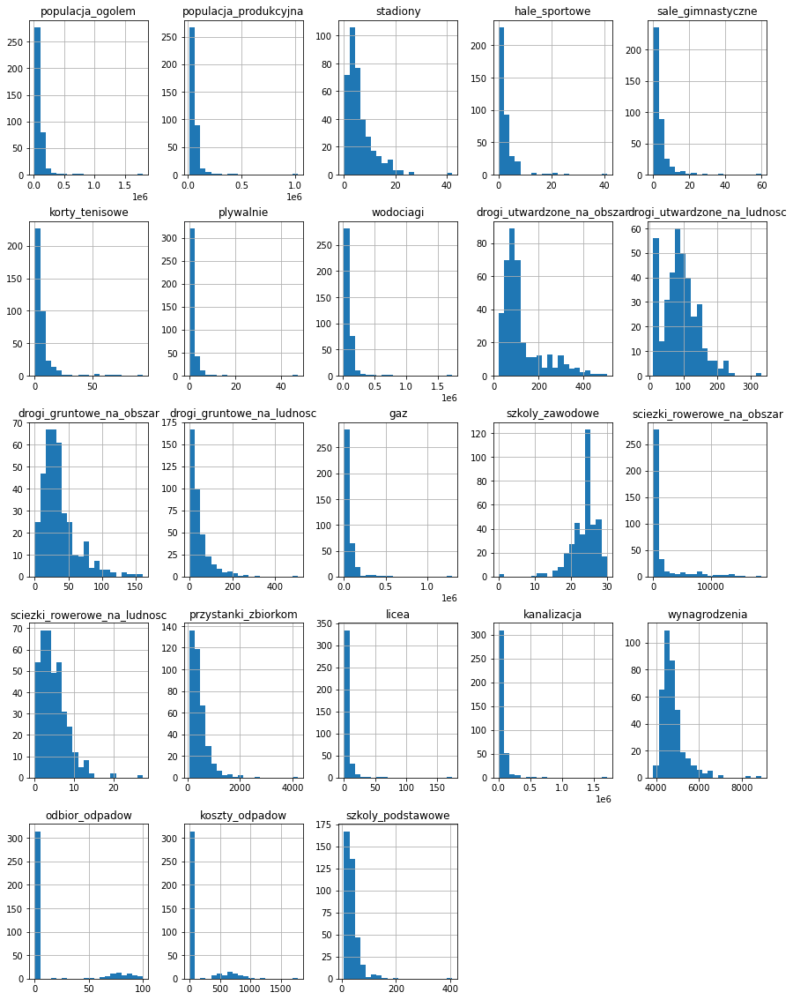

In [4]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
d1.hist(ax = ax, bins=20)

In [5]:
(d1.mean() - d1.quantile(q=0.5))/(d1.std())

C:\Users\Orange\AppData\Local\Temp/ipykernel_6664/1730502888.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  (d1.mean() - d1.quantile(q=0.5))/(d1.std())


populacja_ogolem               0.208420
populacja_produkcyjna          0.208691
stadiony                       0.246126
hale_sportowe                  0.224207
sale_gimnastyczne              0.204853
korty_tenisowe                 0.299941
plywalnie                      0.181053
wodociagi                      0.213240
drogi_utwardzone_na_obszar     0.355109
drogi_utwardzone_na_ludnosc    0.048435
drogi_gruntowe_na_obszar       0.237989
drogi_gruntowe_na_ludnosc      0.287100
gaz                            0.239453
szkoly_zawodowe               -0.135834
sciezki_rowerowe_na_obszar     0.399908
sciezki_rowerowe_na_ludnosc    0.197232
przystanki_zbiorkom            0.246366
licea                          0.164723
kanalizacja                    0.218354
wynagrodzenia                  0.233552
odbior_odpadow                 0.448705
koszty_odpadow                 0.429704
szkoly_podstawowe              0.248885
dtype: float64

Dominują rozkłady prawoskośne. Cechami, które nie mają rozkładu prawoskośnego są szkoły zawodowe, licea i pływalnie, co może wynikać z tego, że tego typu obiekty skupiają się głównie w większych powiatach bądź miastach na prawach powiatu w dużych ilościach na powiat.

### 3. Analiza zależności między danymi

Do analizy zależności między danymi wykorzystaliśmy wykres mapy cieplnej ze skalą której wartości stanowi korelacja liniowa między analizowanymi cechami. Przed narysowaniem wykresu dodaliśmy kilka zmiennych pochodnych od ludności w celu łatwiejszego zauważania korelacji między populacją a daną cechą powiatu.

In [6]:
d2 = d1
d2['drogi_utwardzone'] = [x * y for x, y in zip(d2['drogi_utwardzone_na_ludnosc'], d2['populacja_ogolem'])]
d2['sciezki_rowerowe'] = [x * y for x, y in zip(d2['sciezki_rowerowe_na_ludnosc'], d2['populacja_ogolem'])]

<AxesSubplot:>

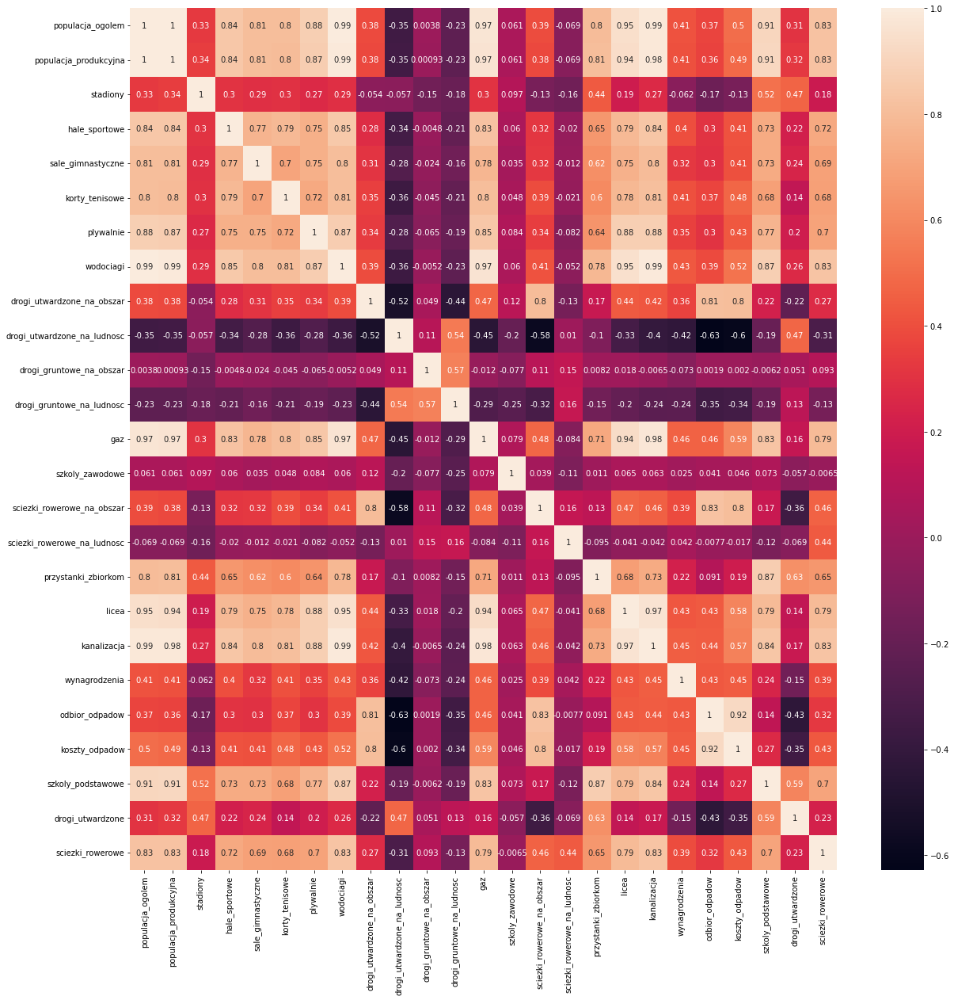

In [7]:
plt.figure(figsize=(20,20))
sns.heatmap(d2.corr(),annot = d2.corr())

Z analizy korelacji liniowej cech w zbiorze danych można zauważyć, że najbardziej skorelowanymi z populacją elementami infrastruktury są:
 - obiekty sportowe - wyjątkiem są stadiony, co może wynikać z nieco odmiennej funkcji. Obiekty takie jak m.in. basen, sale gimnastyczne pełnią funkcję sportowo-rekreacyjną dla mieszakańców, a stadion głównie rozrywkową. Dodatkowo stadiony są dużymi inwestycjami, na które nie stać małe powiaty.
 - placówki oświatowe - szkoły podstawowe i szkoły średnie takie jak licea ogólnokształcące (ale już nie szkoły zawodowe)
 - infrastruktura komunalna - dostęp do sieci wodociągowej, kanalizacyjnej, gazowej
 - ścieżki rowerowe
 

### 4. Wizualizacja danych

Aby porównać obserwacje dla korelacji liniowej z punktu 3 z wykresami par cech, utworzyliśmy macierz wykresów punktowych.

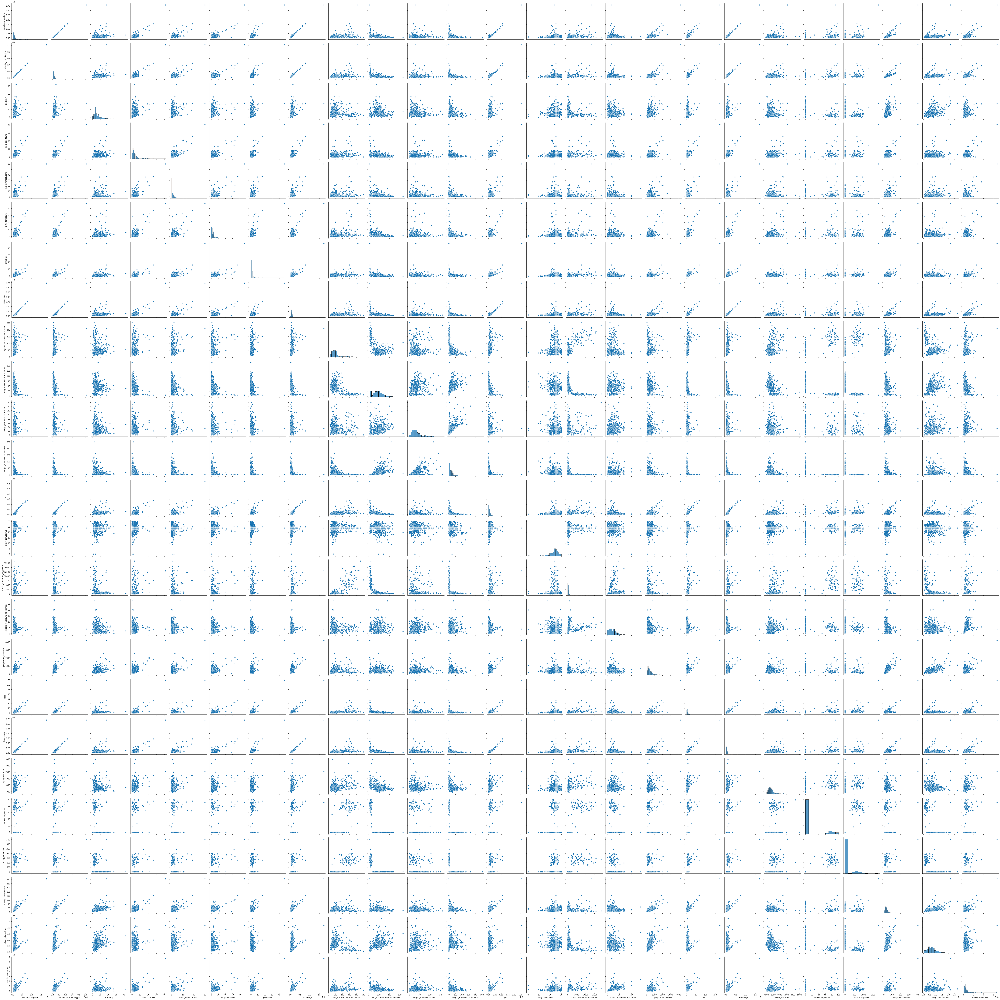

In [8]:
sns.pairplot(d2, kind="scatter", height=3)
plt.show()

Dla lepszej widoczności, podzieliliśmy zbiór danych na miasta na prawach powiatu, które posiadają znacząco większą populację, i pozostałe powiaty.

In [9]:
p_miejskie = d2[d2['powiat'].str.contains('Powiat m\\.')]

In [10]:
p_ziemskie = pd.concat([d1, p_miejskie]).drop_duplicates(keep=False)

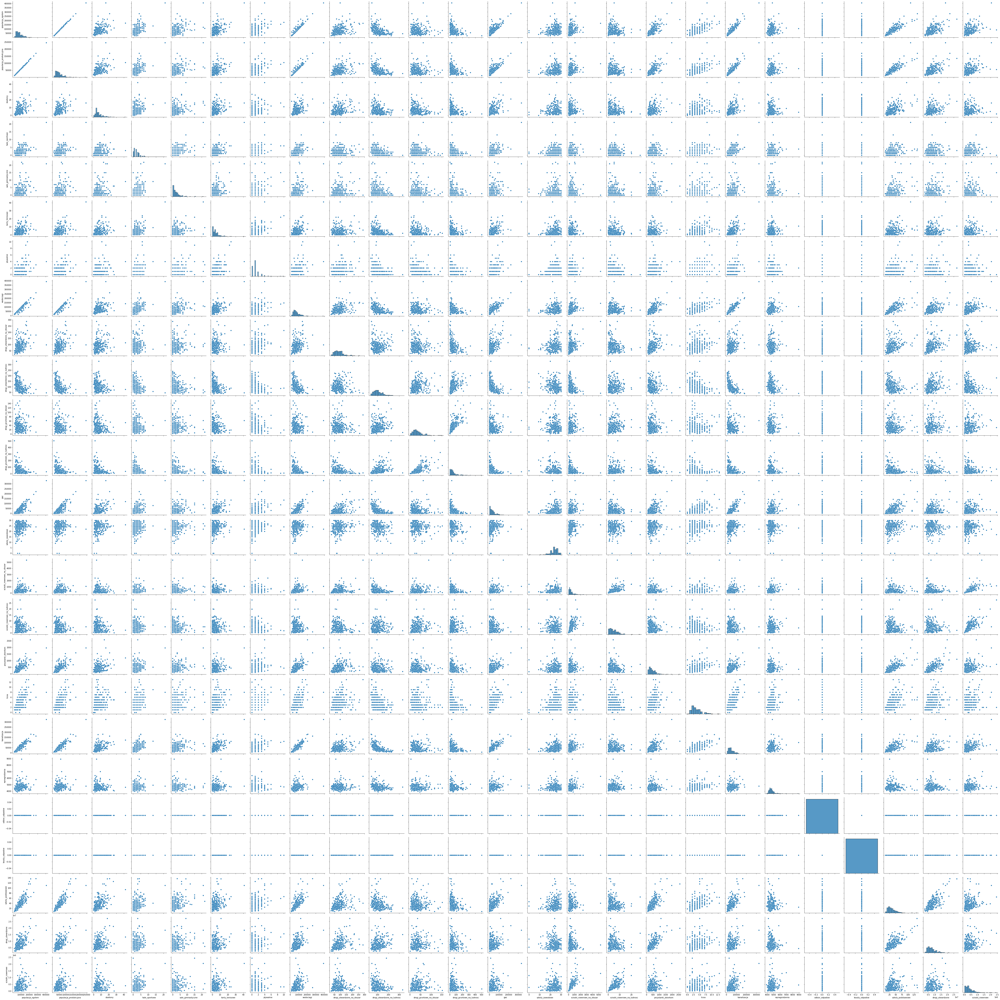

In [11]:
sns.pairplot(p_ziemskie, kind="scatter", height=3)
plt.show()

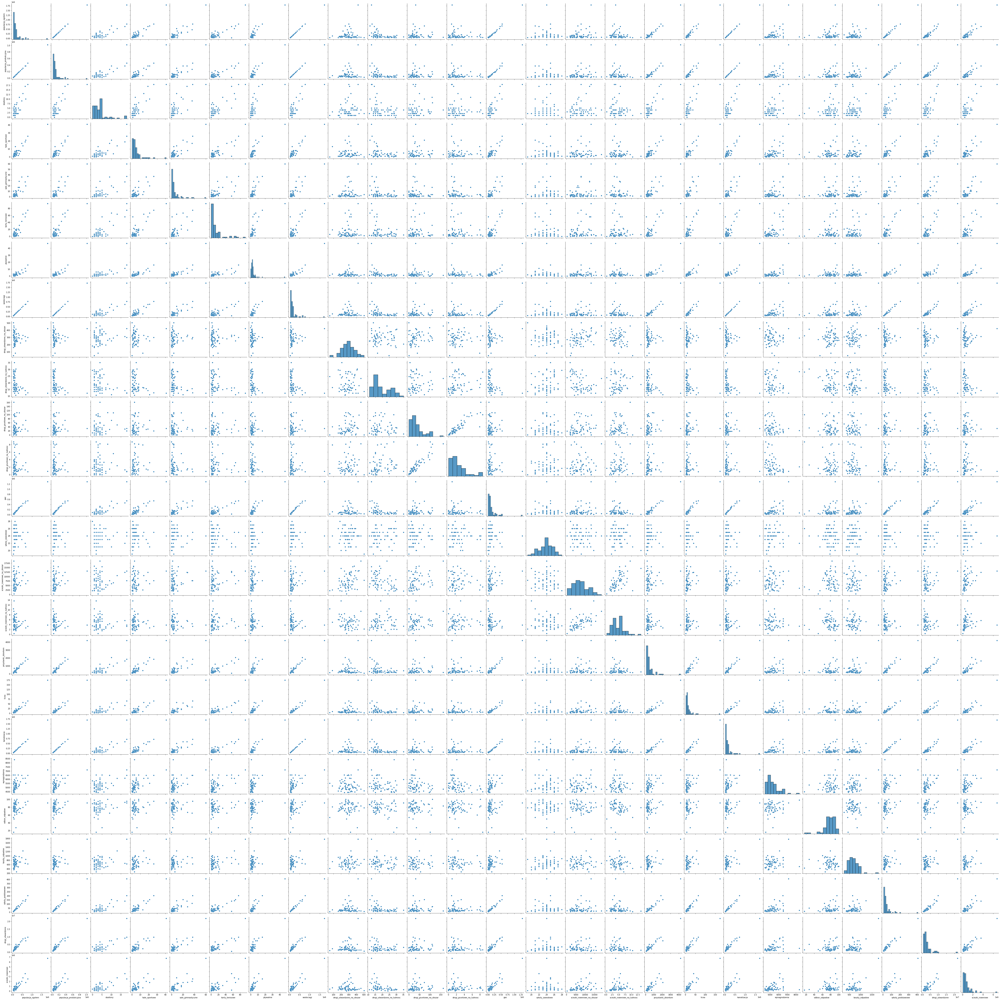

In [12]:
sns.pairplot(p_miejskie, kind="scatter", height=3)
plt.show()

Na utworzonych powyżej wykresach punktowych łatwo zauważyć korelację liniową użytą w punkcie 3, co podkreśla słuszność zastosowania tego typu korelacji w szukaniu zależności między zmienną populacji, a cechami opisującymi.

Na podstawie powyższych obserwacji stawiamy tezę, że ludność powiatu jest silnie skorelowana z infrastrukturą komunalną taką jak dostęp do wodociągów, kanalizacji, sieci gazowych i infrastrukturą społeczną taką jak pływalnie, hale sportowe, sale gimnastyczne, korty tenisowe, licea oraz szkoły podstawowe.